<a href="https://colab.research.google.com/github/soulqan/PCVK_GANJIL_2025/blob/main/week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import glob
from math import log10, sqrt
from google.colab.patches import cv2_imshow

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


 Mengubah tingkat kecerahan citra 
----------------------------------
Masukkan nilai kecerahan: 50


/tmp/ipython-input-2571682150.py:15: RuntimeWarning: overflow encountered in scalar add
  brightness_image[y, x, c] = np.clip(original[y, x, c] + brightness, 0, 255)


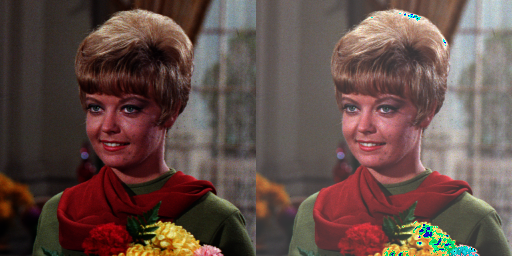

In [10]:
print(' Mengubah tingkat kecerahan citra ')
print('----------------------------------')
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/images/female.tiff')
brightness_image = np.zeros(original.shape, original.dtype)

# akses per piksel
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y, x, c] = np.clip(original[y, x, c] + brightness, 0, 255)

# cara simple tanpa for loop
# brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat([original, brightness_image])
cv2_imshow(final_frame)


Inverse Citra
----------------------------------


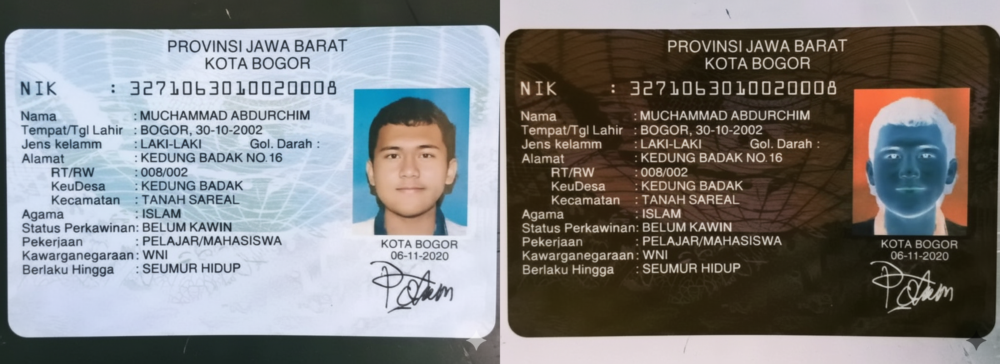

In [19]:
print('Inverse Citra')
print('----------------------------------')

original = cv.imread('/content/drive/MyDrive/images/KTP_OHIM.png')

# g(x,y) = 255 - f(x,y)
inverse_img = 255 - original

final_frame = cv.hconcat([original, inverse_img])
cv2_imshow(final_frame)


mengubah kontras dan tingkat kecerahan citra
----------------------------------
Masukkan nilai kecerahan (-255 sampai 255): 50
Masukkan nilai kontras (1.0 - 3.0): 2


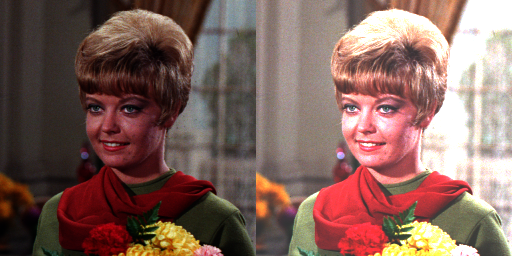

In [23]:
print('mengubah kontras dan tingkat kecerahan citra')
print('----------------------------------')
original = cv.imread('/content/drive/MyDrive/images/female.tiff')
try:
    brightness = int(input('Masukkan nilai kecerahan (-255 sampai 255): '))
    contrast = float(input('Masukkan nilai kontras (1.0 - 3.0): '))

except ValueError:
    print('Error, input bukan angka')

contrast = max(1.0, min(contrast, 3.0))
brightness = max(-255, min(brightness, 255))

contrast_bright_img = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            new_val = contrast * original[y, x, c] + brightness
            contrast_bright_img[y, x, c] = np.clip(new_val, 0, 255)

final_frame = cv.hconcat([original, contrast_bright_img])
cv2_imshow(final_frame)


Mengubah tingkat kecerahan citra dengan transformasi log
----------------------------------
Masukkan nilai kecerahan: 50


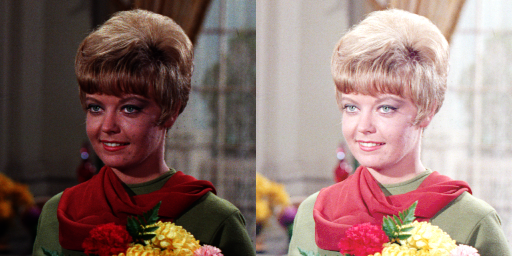

In [25]:
print('Mengubah tingkat kecerahan citra dengan transformasi log')
print('----------------------------------')

try:
    c = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, input bukan angka')
    c = 30

log_img = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for ch in range(original.shape[2]):
            new_val = c * np.log1p(original[y, x, ch])
            log_img[y, x, ch] = np.clip(new_val, 0, 255)

final_frame = cv.hconcat([original, log_img])
cv2_imshow(final_frame)


D1.4.a – Grayscale Averaging
----------------------------------


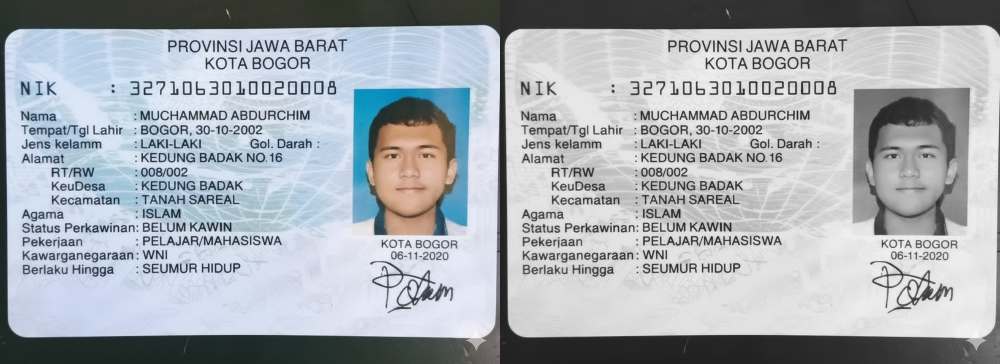

In [28]:
print('D1.4.a – Grayscale Averaging')
print('----------------------------------')
original = cv.imread('/content/drive/MyDrive/images/KTP_OHIM.png')
gray_avg = np.mean(original, axis=2).astype(np.uint8)
gray_avg_bgr = cv.cvtColor(gray_avg, cv.COLOR_GRAY2BGR)

final_frame = cv.hconcat([original, gray_avg_bgr])
cv2_imshow(final_frame)


D1.4.b – Grayscale Lightness
----------------------------------


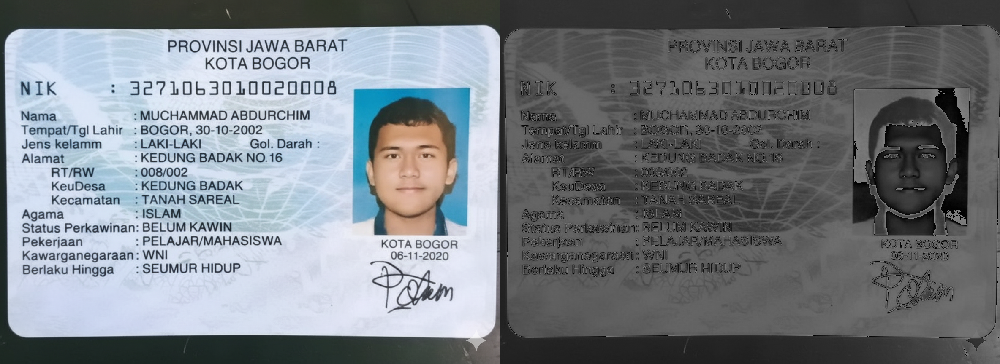

In [32]:
print('D1.4.b – Grayscale Lightness')
print('----------------------------------')
original = cv.imread('/content/drive/MyDrive/images/KTP_OHIM.png')
gray_light = ((np.max(original, axis=2) + np.min(original, axis=2)) / 2).astype(np.uint8)
gray_light_bgr = cv.cvtColor(gray_light, cv.COLOR_GRAY2BGR)

final_frame = cv.hconcat([original, gray_light_bgr])
cv2_imshow(final_frame)


D1.4.c – Grayscale Luminance
----------------------------------


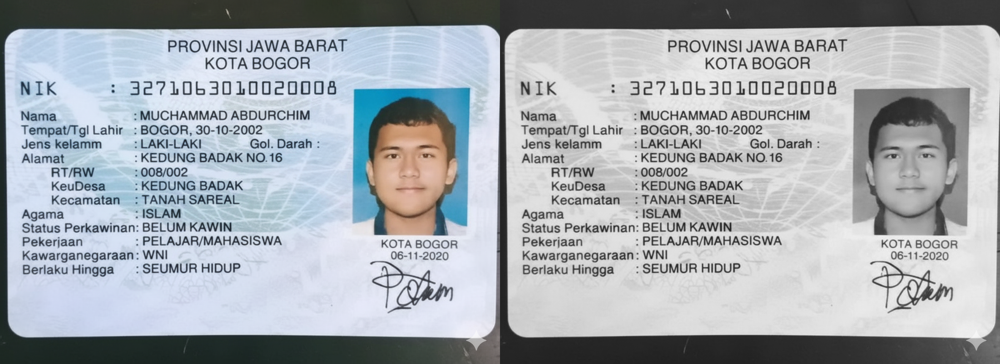

In [33]:
print('D1.4.c – Grayscale Luminance')
print('----------------------------------')

gray_lum = (0.21*original[:,:,2] + 0.72*original[:,:,1] + 0.07*original[:,:,0]).astype(np.uint8)
gray_lum_bgr = cv.cvtColor(gray_lum, cv.COLOR_GRAY2BGR)

final_frame = cv.hconcat([original, gray_lum_bgr])
cv2_imshow(final_frame)
